# Data Visualization

In [1]:
import pandas as pd
import numpy as np
from scipy import signal

import plotly
pd.options.plotting.backend = "plotly"

In [7]:
def read_data(filename):
    dataframe = pd.read_csv(filename)
    return dataframe

healthy = read_data("Data/age24Jan52022.csv")
# healthy2 = read_data("age24Jan52022.csv")
# unhealthy = read_data("ageUManaliAmarasinghe.csv")
# unhealthy2 = read_data("ageChandraniAmarasinghe.csv")

In [ ]:
healthy.plot(y=["PData","PCData"])

In [ ]:
healthy2.plot(y=["PData","PCData"])

In [ ]:
unhealthy.plot(y=["PData","PCData"])

In [ ]:
unhealthy2.plot(y=["PData","PCData"])

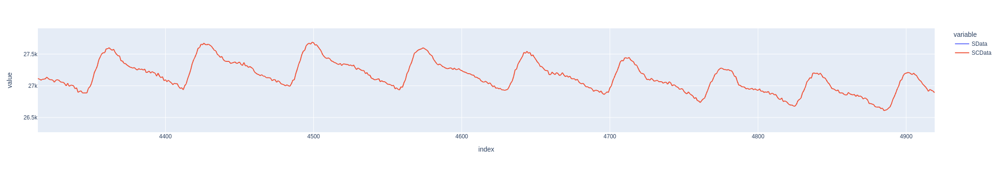

In [8]:
healthy.plot(y=["SData","SCData"])

In [ ]:
unhealthy.plot(y=["SData","SCData"])

In [ ]:
unhealthy2.plot(y=["SData","SCData"])

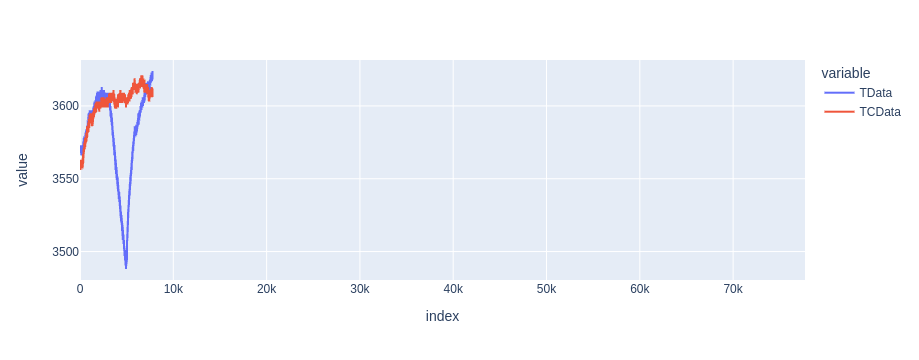

In [9]:
healthy.plot(y=["TData","TCData"])

In [ ]:
healthy2.plot(y=["TData","TCData"])

In [ ]:
unhealthy2.plot(y=["TData","TCData"])

In [ ]:
def filter_ppg(raw_signal, fs):
    # Clean the signal - Mean removal
    raw_signal = raw_signal - np.mean(raw_signal)

    # Lowpass filtering
    A_low = 100
    delt_w_low = 7.21 - 3.8
    M_low = (A_low-8)/(2.285*delt_w_low)
    order_low = 80
    fc_low = 6

    b_low = signal.firwin(order_low, fc_low, window=('kaiser', M_low), fs=fs) 
    filtered_low = filtfilt(b_low, 1, raw_signal)

    # Highpass filtering
    fc_high = 0.5
    order_high = 201

    b_high = signal.firwin(order_high, fc_high, window='hamming', pass_zero=False, fs=fs)       # WHY????
    filtered_bp = filtfilt(b_high, 1, filtered_low)

    return filtered_bp

In [ ]:
import scipy.fftpack
from scipy.signal import butter, filtfilt, medfilt
from scipy.ndimage import uniform_filter1d
from scipy import signal
from scipy.signal import find_peaks
from scipy import interpolate
from scipy.signal.signaltools import detrend

In [ ]:
t = filter_ppg(healthy.SData, 100, True)
df = pd.DataFrame(t)
df.plot()

In [ ]:
t = filter_ppg(unhealthy.SCData, 100, True)
df = pd.DataFrame(t)
df.plot()

In [ ]:
t = filter_ppg(unhealthy.PCData, 100)
df = pd.DataFrame(t)
df.plot()

In [ ]:
t = filter_ppg(healthy.PData, 100)
df = pd.DataFrame(t)
df.plot()

In [2]:
import matplotlib.pyplot as plt
Healthy = {}
Healthy['age24H1']=[676.6694550836286, 20836.553479074388, 18, 18, 0.47475491062987213, 9.166666666666666, 0.026600875604434377, 0.8668219639331449, 0.11822611379748613]
Healthy['age24H2']=[709.6679915964532, 23258.99507148449, 19, 19, 0.5000630472303025, 8.68421052631579, 0.026773082941585157, 0.8030312922164247, 0.11977431842288096]
Healthy['age53H3']=[412.3955216994035, 15371.480024274215, 18, 21, 0.6674361388037556, 9.166666666666666, 0.05092198846743775, 0.8045553647759252, 0.203687953869751]
Healthy['age21H4']=[712.5613225190116, 28030.958626096137, 19, 19, 0.6408122943937185, 8.68421052631579, 0.026664371752359698, 1.1112356329002964, 0.1305150827878659]
Healthy['age21H5']=[265.1785499926682, 9808.958654241052, 19, 19, 0.6493731137628869, 8.68421052631579, 0.07164983744169852, 0.9774877641543037, 0.32053874644970387]
Healthy['age26H6']=[915.2921154817963, 38746.114421543345, 19, 19, 0.7266836322244887, 8.68421052631579, 0.020758400163863183, 1.2577735120162201, 0.10488454819636135]
Healthy['age26H7']=[888.8284832625112, 41234.834628381264, 19, 19, 0.7894695730419984, 8.68421052631579, 0.0213764526652646, 1.4423836257256895, 0.11250764560665578]
Healthy['age26H8'] =[606.5702558027584, 24794.05953728372, 23, 19, 0.6031523786765676, 7.173913043478261, 0.03132365924348643, 1.23013626702118, 0.16815859172819028]
Healthy['age60D1'] = [229.31130918499625, 10714.946492307063, 24, 27, 0.6582487730690258, 6.875, 0.11774386573414845, 0.5678169424664535, 0.4317275076918776]
Healthy['age60D2'] = [798.0178721107249, 31300.175059903, 20, 23, 0.6321044913642676, 8.25, 0.028821409649843973, 0.7197588720335463, 0.11528563859937589]
Healthy['age24D3'] = [581.4898666173374, 33523.92968427435, 58, 17, 0.9807712147313173, 2.8448275862068964, 0.029235247208851598, 2.661734587880381, 0.20808617131006135]


In [3]:
df = pd.DataFrame.from_dict(Healthy, orient='index')
df.columns =["sys_pk", "AUC", "delt_T", "CT", "RI", "SI", "STT", "IPA", "pulse_wa_ratio"]
df["class"] = ["Healthy", "Healthy","Healthy","Healthy","Healthy","Healthy","Healthy","Healthy","Diabetic", "Diabetic","Diabetic"]
df.head(9)

,sys_pk,AUC,delt_T,CT,RI,SI,STT,IPA,pulse_wa_ratio,class
age24H1,676.669455,20836.553479,18,18,0.474755,9.166667,0.026601,0.866822,0.118226,Healthy
age24H2,709.667992,23258.995071,19,19,0.500063,8.684211,0.026773,0.803031,0.119774,Healthy
age53H3,412.395522,15371.480024,18,21,0.667436,9.166667,0.050922,0.804555,0.203688,Healthy
age21H4,712.561323,28030.958626,19,19,0.640812,8.684211,0.026664,1.111236,0.130515,Healthy
age21H5,265.178550,9808.958654,19,19,0.649373,8.684211,0.071650,0.977488,0.320539,Healthy
age26H6,915.292115,38746.114422,19,19,0.726684,8.684211,0.020758,1.257774,0.104885,Healthy
age26H7,888.828483,41234.834628,19,19,0.789470,8.684211,0.021376,1.442384,0.112508,Healthy
age26H8,606.570256,24794.059537,23,19,0.603152,7.173913,0.031324,1.230136,0.168159,Healthy
age60D1,229.311309,10714.946492,24,27,0.658249,6.875000,0.117744,0.567817,0.431728,Diabetic


In [4]:
plt.bar(df.index, df["sys_pk"], color=[x: "red" if x == "Diabetic" for x in df["class"] else "blue"])

SyntaxError: expression cannot contain assignment, perhaps you meant "=="? (<ipython-input-4-7d5f3c3dfeca>, line 1)

In [46]:
ppg_indices ={}
ppg_indices['age24H1'] =[0.9992003489762625, 30.741095144774516, 18, 18, 0.47410825982504196, 9.166666666666666, 18.01440523759026, 0.8647432229990004, 80.06402327817894]
ppg_indices['age24H2'] =[0.9980241810509046, 32.66889700135333, 19, 19, 0.49951032988966726, 8.68421052631579, 19.03761488022593, 0.7998835098354159, 85.16827709574758]
ppg_indices['age53H3'] =[0.9963149320755169, 36.99520953949352, 18, 21, 0.6649360387173882, 9.166666666666666, 21.07767265542526, 0.7937365408632987, 84.31069062170104]
ppg_indices['age21H4'] =[0.9986864256324319, 39.21462300096046, 19, 19, 0.6401316373039972, 8.68421052631579, 19.02499074017952, 1.106137364757838, 93.12232309666818]
ppg_indices['age21H5'] =[0.9964646717119631, 37.001722683579565, 19, 19, 0.6544111597843393, 8.68421052631579, 19.06740955237008, 0.982362638926353, 85.30156905007667]
ppg_indices['age26H6'] =[0.9971591129461075, 45.43198207992785, 22, 22, 0.7649991032300114, 7.5, 22.0626775750973, 0.9527094478455121, 94.26780418450664]
ppg_indices['age26H7'] =[0.9982772185443061, 38.38964531625033, 18, 18, 0.580180180092453, 9.166666666666666, 18.031063581965448, 1.326008129130884, 96.16567243714906]
ppg_indices['age26H8'] =[0.998889159733204, 47.22934667493772, 20, 20, 0.8114284532887909, 8.25, 20.022241512103157, 1.3007030305545837, 99.11009548491063]
ppg_indices['age60D1'] =[0.9902240973671217, 44.531583795480856, 25, 28, 0.5849739983662248, 6.6, 28.27642760305308, 0.43200841299440823, 97.95762419629102]
ppg_indices['age61D2'] =[0.9990307762692451, 39.20619252512148, 20, 23, 0.6323638519687248, 8.25, 23.02231377284553, 0.7181930716843788, 92.08925509138211]
ppg_indices['age24D3'] =[0.9990381443881914, 33.226226431906234, 22, 18, 0.5349125668889095, 7.5, 18.017330070037673, 0.9521761012983451, 84.08087366017581]

In [47]:
ppg_indices2 = {}
ppg_indices2['age24H1'] =[969.7473156188196, 29585.804469641647, 24, 18, 0.465945235165261, 6.875, 0.018561536299292313, 0.8156014800737748, 0.08249571688574361]
ppg_indices2['age24H2'] =[977.9286320320659, 32049.12093773025, 23, 18, 0.5065885625218787, 7.173913043478261, 0.01840625114186225, 0.9996547708671177, 0.08691840816990506]
ppg_indices2['age53H3'] =[780.7588239402945, 27872.390109286775, 18, 21, 0.6130918879140826, 9.166666666666666, 0.026896910231533795, 0.7349434165475612, 0.10630683567701452]
ppg_indices2['age21H4'] =[1057.918981428486, 43305.674558453466, 20, 20, 0.6909937605466786, 8.25, 0.018905039375505313, 1.0782526961326735, 0.0879084330960997]
ppg_indices2['age21H5'] =[716.6958880340762, 26049.244988186012, 19, 19, 0.645444382352103, 8.68421052631579, 0.026510546965907274, 0.9382502351917082, 0.1185998153737957]
ppg_indices2['age26H6'] =[826.8367703845431, 34558.19156235109, 19, 19, 0.7223015987297503, 8.68421052631579, 0.02297914253518688, 1.2722325588742704, 0.11368628412145086]
ppg_indices2['age26H7'] =[1176.9710197207655, 49459.347341652836, 19, 19, 0.6718722123946697, 8.68421052631579, 0.016143133247671398, 1.3217757677877093, 0.0824149434223224]
ppg_indices2['age26H8'] =[926.7775607718646, 42429.57634127875, 19, 19, 0.7822264437590939, 8.68421052631579, 0.02050114375252665, 1.4169369821066986, 0.10682174902632308]
ppg_indices2['age60D1'] =[76.6482639589279, 4496.409191513847, 29, 27, 0.7668899204409512, 5.689655172413793, 0.35225846751686374, 0.4622171784448374, 1.304660990803199]
ppg_indices2['age61D2'] =[540.773544770198, 20895.393936127584, 20, 23, 0.6193329422893277, 8.25, 0.04253166639239696, 0.7042771323519795, 0.17012666556958783]
ppg_indices2['age24D3'] =[1096.3090612649403, 38047.3642965284, 24, 18, 0.5862617731436408, 6.875, 0.016418727743827355, 1.0653501839769057, 0.07662072947119433]

In [52]:
ppg_indices2 = pd.DataFrame.from_dict(ppg_indices2, orient='index')
ppg_indices = pd.DataFrame.from_dict(ppg_indices, orient='index')

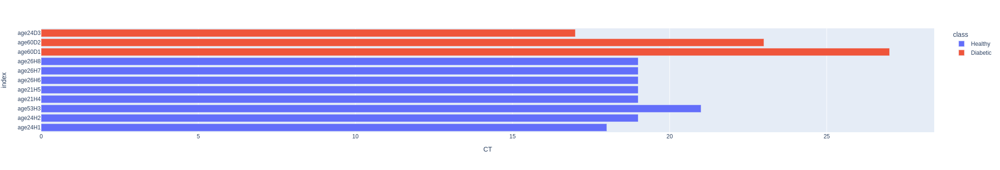

In [7]:
df.plot.bar("CT", color="class")

In [ ]:
df.plot.bar("SI", color="class")

In [30]:
pressure_indices ={}
pressure_indices['age24H1']=[199.67207980082327, 6488.8333625338, 26, 17, 0.5148753603048166, 6.346153846153846, 0.08513959496469324, 1.0493107290764536, 0.40065691748090937]
pressure_indices['age24H2']=[240.7217751139734, 8298.410436524873, 24, 18, 0.5488621845661878, 6.875, 0.07477512157542718, 0.9320090280223354, 0.35310474077285053]
pressure_indices['age53H3']=[217.13389094965515, 8199.275295558677, 18, 20, 0.6489006725034314, 9.166666666666666, 0.09210906649592171, 0.8399710592547275, 0.3868580792828712]
pressure_indices['age21H4']=[172.43817076518548, 7277.594817291029, 18, 18, 0.7242284813363913, 9.166666666666666, 0.10438524092505697, 1.3733804336865922, 0.539323744779461]
pressure_indices['age21H5']=[243.42910252375887, 8570.303732581957, 18, 18, 0.599581329622217, 9.166666666666666, 0.0739435006471471, 0.9801831579968572, 0.3491776419448613]
pressure_indices['age60D1']=[58.8863793009275, 2789.923134552762, 29, 29, 0.5139791208528345, 5.689655172413793, 0.4924738172778646, 0.3569917672054986, 1.6642218652838183]
pressure_indices['age60D2']=[218.00401453795746, 9533.224180603953, 26, 26, 0.560827444333531, 6.346153846153846, 0.11926385876473411, 0.37855409554965747, 0.4174235056765694]

In [33]:
df_pressure = pd.DataFrame.from_dict(pressure_indices, orient='index')
df_pressure.columns =["sys_pk", "AUC", "delt_T", "CT", "RI", "SI", "STT", "IPA", "pulse_wa_ratio"]
df_pressure["class"] = ["Healthy", "Healthy","Healthy","Healthy","Healthy", "Diabetic", "Diabetic"]
df_pressure.head(9)

,sys_pk,AUC,delt_T,CT,RI,SI,STT,IPA,pulse_wa_ratio,class
age24H1,199.672080,6488.833363,26,17,0.514875,6.346154,0.085140,1.049311,0.400657,Healthy
age24H2,240.721775,8298.410437,24,18,0.548862,6.875000,0.074775,0.932009,0.353105,Healthy
age53H3,217.133891,8199.275296,18,20,0.648901,9.166667,0.092109,0.839971,0.386858,Healthy
age21H4,172.438171,7277.594817,18,18,0.724228,9.166667,0.104385,1.373380,0.539324,Healthy
age21H5,243.429103,8570.303733,18,18,0.599581,9.166667,0.073944,0.980183,0.349178,Healthy
age60D1,58.886379,2789.923135,29,29,0.513979,5.689655,0.492474,0.356992,1.664222,Diabetic
age60D2,218.004015,9533.224181,26,26,0.560827,6.346154,0.119264,0.378554,0.417424,Diabetic


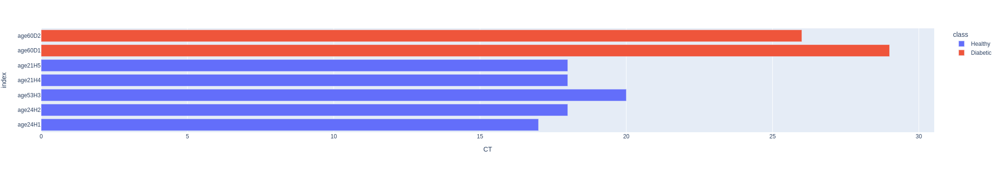

In [36]:
df_pressure.plot.bar("CT", color="class")

In [ ]:
dataset = {
    "age24H1":("age24Jan52022.csv",14400,17000, "Healthy" , 4943, True),
    "age24H2":("age24Jan102022.csv",14400,17000, "Healthy", 4783, True),
    "age53H3":("age53Dec292021.csv",14400,17000, "Healthy", 7560, True),
    "age21H4":("age21Jan52022.csv",21000,23600, "Healthy" , 5116, True),
    "age21H5":("age21Jan102022.csv",14400,17000, "Healthy", 4956, True),
    "age26H6":("age26Feb62022.csv",14400,17000, "Healthy", 4967, False),
    "age26H7":("age26_2Feb62022.csv",14400,17000, "Healthy", 4979, True),
    "age26H8":("age26_3Feb62022.csv",14400,17000, "Healthy", 4967, False ),
#     "age60D1":("ageChandraniAmarasinghe.csv",1000,3600, "Diabetic", 5250, True),
    "age61D2":("ageUManaliAmarasinghe.csv",14400,17000, "Diabetic", 5624, True),
    "age24D3":("age24Feb82022.csv",14400,17000, "Diabetic" , 5050, True),
    "age52D4":("twFeb-15-2022.csv",14400,17000, "Diabetic" , 5050, True)
}